In [1]:
# --- Common Libraries ---
# For file and directory operations
import os
# For array operations
import numpy as np
# For data manipulation
import pandas as pd
# For file globbing (finding named files)
from glob import glob
# TensorFlow for neural network operations
import tensorflow as tf
# TensorFlow's image operations
import tensorflow.image as tfi

# --- Data Processing Libraries ---
# For converting images to arrays, loading images and data augmentation
from tensorflow.keras.preprocessing.image import img_to_array, load_img, ImageDataGenerator
# Utilities for data transformation
from tensorflow.keras.utils import to_categorical

# --- Data Visualization Libraries ---
# For plotting and visualization
import matplotlib.pyplot as plt

# --- Model Building Libraries ---
# Base model class
from tensorflow.keras.models import Model
# Neural network layers
from tensorflow.keras.layers import (Layer, Conv2D, Dropout, UpSampling2D, concatenate, Add, Multiply, 
                                    Input, MaxPool2D, BatchNormalization)

# --- Callbacks for Model Training ---
# Base callback class
from tensorflow.keras.callbacks import Callback
# To stop training when a tracked metric has stopped improving
from tensorflow.keras.callbacks import EarlyStopping
# To save the model or weights, at some frequency
from tensorflow.keras.callbacks import ModelCheckpoint
# For learning rate adjustments during training
from tensorflow.keras.callbacks import LearningRateScheduler
# For visualizing intermediate activation heatmaps
from tf_explain.core.grad_cam import GradCAM

# --- Metrics and Data Splitting Libraries ---
# For evaluating the quality of the model's predictions
from tensorflow.keras.metrics import MeanIoU
# For splitting dataset into training and testing sets
from sklearn.model_selection import train_test_split

# --- Miscellaneous Libraries ---
# Python Imaging Library for image operations
from PIL import Image
# For file operations
import shutil
# To manage and display warnings
import warnings
# OpenCV for image post-processing tasks
import cv2
# TensorFlow's backend operations
from tensorflow.keras import backend as K

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


2023-09-06 19:28:47.296896: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
def load_image(image, SIZE):
    """
    Load and resize an image from the provided path.

    Parameters:
    - image (str): Path to the image file.
    - SIZE (int): Target size for the resized image (assumes square image).

    Returns:
    - np.array: A 4-decimal rounded resized image array.
    """
    # Resize the image to the specified SIZE, convert to an array, and normalize pixel values to [0,1].
    return np.round(tf.image.resize(img_to_array(load_img(image))/255., (SIZE, SIZE)), 4)

def load_images(image_paths, SIZE, mask=False, trim=None):
    """
    Load and resize multiple images from provided paths.

    Parameters:
    - image_paths (list): List of paths to the image files.
    - SIZE (int): Target size for the resized images (assumes square images).
    - mask (bool): If True, it will treat the images as masks and load only one channel.
    - trim (int, optional): If specified, will load only the first 'trim' number of images.

    Returns:
    - np.array: A numpy array containing the loaded and resized images.
    """
    
    # If trim is specified, select only the first 'trim' number of image paths.
    if trim is not None:
        image_paths = image_paths[:trim]
    
    # Initialize an empty numpy array with the correct shape based on whether images are masks or not.
    if mask:
        images = np.zeros(shape=(len(image_paths), SIZE, SIZE, 1))
    else:
        images = np.zeros(shape=(len(image_paths), SIZE, SIZE, 3))
    
    # Loop through the image paths and load each image into the initialized numpy array.
    for i, image in enumerate(image_paths):
        img = load_image(image, SIZE)
        if mask:
            # If images are masks, only take the first channel.
            images[i] = img[:, :, :1]
        else:
            # If images are not masks, take all channels.
            images[i] = img
    
    # Return the array containing the loaded images.
    return images

In [3]:
def show_image(image, title=None, cmap=None, alpha=1, centroid=None):
    """Display an image with optional title and centroid."""
    plt.imshow(image, cmap=cmap, alpha=alpha)
    if title is not None:
        plt.title(title)
    if centroid is not None:
        plt.plot(centroid[1], centroid[0], 'ro')  # Plot the centroid. Note that plt.plot takes x, y (column, row)
    plt.axis('off')

def show_mask(image, mask, centroid=None, cmap=None, alpha=0.4):
    """Display an image with a mask overlay and optional centroid."""
    plt.imshow(image)
    plt.imshow(tf.squeeze(mask), cmap=cmap, alpha=alpha)
    if centroid is not None:
        plt.plot(centroid[1], centroid[0], 'ro')  # Plot the centroid. Note that plt.plot takes x, y (column, row)
    plt.axis('off')

# Define a global variable SIZE which can be used as a standard image size throughout the code
SIZE = 256

In [4]:
# New Path: "/Users/ummefahmidaakter/Desktop/Completed Assessments/Dissertation/dissertation_project/lumen4"
# If any error occurs while running this code, it mostly could be bacause of incorrect root path

# Define the root path where the dataset is stored
root_path = "/Users/ummefahmidaakter/Downloads/lumen4"

# Define the folder paths for train, test, and validation sets
# Note: The dataset is divided into image and mask directories for train, val, and test sets

# Image folder paths
train_image_path = os.path.join(root_path, "train/image")
val_image_path = os.path.join(root_path, "val/image")
test_image_path = os.path.join(root_path, "test/image")

# Mask folder paths
train_mask_path = os.path.join(root_path, "train/mask")
val_mask_path = os.path.join(root_path, "val/mask")
test_mask_path = os.path.join(root_path, "test/mask")

# Get a list of image files in each folder
# Only files with '.jpg' extension are considered as images
train_image_files = [file for file in os.listdir(train_image_path) if file.endswith('.jpg')]
val_image_files = [file for file in os.listdir(val_image_path) if file.endswith('.jpg')]
test_image_files = [file for file in os.listdir(test_image_path) if file.endswith('.jpg')]

# Create lists to store full paths to images
train_image_paths = [os.path.join(train_image_path, file) for file in train_image_files]
val_image_paths = [os.path.join(val_image_path, file) for file in val_image_files]
test_image_paths = [os.path.join(test_image_path, file) for file in test_image_files]

# Assuming the masks have '.png' extension and have the same filenames as the images,
# Replace the '.jpg' extension with '.png' to get mask filenames
train_mask_files = [file.replace('.jpg', '.png') for file in train_image_files]
val_mask_files = [file.replace('.jpg', '.png') for file in val_image_files]
test_mask_files = [file.replace('.jpg', '.png') for file in test_image_files]

# Create lists to store full paths to masks
train_mask_paths = [os.path.join(train_mask_path, file) for file in train_mask_files]
val_mask_paths = [os.path.join(val_mask_path, file) for file in val_mask_files]
test_mask_paths = [os.path.join(test_mask_path, file) for file in test_mask_files]

# Assuming a function 'load_images' is available to load the images and masks from their paths
# Load the images and masks for the training, validation, and testing sets
train_images = load_images(train_image_paths, SIZE)
val_images = load_images(val_image_paths, SIZE)
test_images = load_images(test_image_paths, SIZE)

# Load masks with an additional argument indicating they're masks
train_masks = load_images(train_mask_paths, SIZE, mask=True)
val_masks = load_images(val_mask_paths, SIZE, mask=True)
test_masks = load_images(test_mask_paths, SIZE, mask=True)

# Print the shapes of the loaded masks as a basic check
print("Shape of train_masks:", train_masks.shape)
print("Shape of val_masks:", val_masks.shape)
print("Shape of test_masks:", test_masks.shape)

2023-09-06 19:29:02.954237: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Shape of train_masks: (191, 256, 256, 1)
Shape of val_masks: (41, 256, 256, 1)
Shape of test_masks: (40, 256, 256, 1)


In [5]:
class EncoderBlock(Layer):
    """
    Encoder Block class defines a block for the encoder part of a U-Net style architecture.
    
    This block consists of two convolutional layers interspersed with a dropout layer.
    Optionally, a max pooling layer can be added at the end.
    """

    def __init__(self, filters, rate, pooling=True, **kwargs):
        """
        Initializes the EncoderBlock with given parameters.
        
        Args:
            filters (int): Number of filters for the convolutional layers.
            rate (float): Dropout rate for the dropout layer.
            pooling (bool, optional): If True, adds a max pooling layer after the convolutions. Defaults to True.
        """
        super(EncoderBlock, self).__init__(**kwargs)

        # Initializing instance variables
        self.filters = filters
        self.rate = rate
        self.pooling = pooling
        
        # Defining the layers
        # First convolutional layer
        self.c1 = Conv2D(filters, kernel_size=3, strides=1, padding='same', activation='relu', kernel_initializer='he_normal')
        
        # Dropout layer
        self.drop = Dropout(rate)
        
        # Second convolutional layer
        self.c2 = Conv2D(filters, kernel_size=3, strides=1, padding='same', activation='relu', kernel_initializer='he_normal')
        
        # Max pooling layer
        self.pool = MaxPool2D()

    def call(self, X):
        """
        Forward pass for the encoder block.
        
        Args:
            X (tensor): Input tensor.
            
        Returns:
            tensor: Output tensor. If pooling=True, returns both pooled output and convolved output.
        """
        x = self.c1(X)
        x = self.drop(x)
        x = self.c2(x)
        
        # If pooling is enabled, return both the pooled and convolved outputs
        if self.pooling:
            y = self.pool(x)
            return y, x
        else:
            return x

    def get_config(self):
        """
        Returns the config of the encoder block, used for model saving and loading.
        
        Returns:
            dict: Configuration dictionary.
        """
        base_config = super().get_config()
        return {
            **base_config,
            "filters": self.filters,
            'rate': self.rate,
            'pooling': self.pooling
        }

In [6]:
class DecoderBlock(Layer):
    """
    Decoder Block class defines a block for the decoder part of a U-Net style architecture.
    
    This block performs upsampling on the input tensor and then concatenates it with a skip 
    connection tensor. This concatenated tensor is then passed through an EncoderBlock (acting 
    as a double convolutional block without pooling).
    """

    def __init__(self, filters, rate, **kwargs):
        """
        Initializes the DecoderBlock with given parameters.
        
        Args:
            filters (int): Number of filters for the convolutional layers within the EncoderBlock.
            rate (float): Dropout rate for the dropout layer within the EncoderBlock.
        """
        super(DecoderBlock, self).__init__(**kwargs)

        # Initializing instance variables
        self.filters = filters
        self.rate = rate
        
        # Define Upsampling layer to upscale the input
        self.up = UpSampling2D()
        
        # Using an EncoderBlock (without pooling) as the convolutional block
        # for the decoder after upsampling and concatenation
        self.net = EncoderBlock(filters, rate, pooling=False)

    def call(self, X):
        """
        Forward pass for the decoder block.
        
        Args:
            X (tuple): A tuple containing two tensors - the tensor to be upsampled and 
                       the skip connection tensor.
            
        Returns:
            tensor: Output tensor after upsampling, concatenation and convolution.
        """
        X, skip_X = X  # Unpack the tuple
        x = self.up(X)  # Upsample
        c_ = concatenate([x, skip_X])  # Concatenate with skip connection tensor
        x = self.net(c_)  # Pass through the convolutional block
        return x

    def get_config(self):
        """
        Returns the config of the decoder block, used for model saving and loading.
        
        Returns:
            dict: Configuration dictionary.
        """
        base_config = super().get_config()
        return {
            **base_config,
            "filters": self.filters,
            'rate': self.rate,
        }

In [7]:
class AttentionGate(Layer):
    """
    AttentionGate class implements an attention mechanism used in certain variants 
    of U-Net architectures.
    
    This gate refines the skip connections before they are concatenated with the 
    upsampled decoder output. It allows the network to focus on more relevant regions 
    by weighting the importance of different regions in the skip connection.
    """

    def __init__(self, filters, bn, **kwargs):
        """
        Initializes the AttentionGate with given parameters.
        
        Args:
            filters (int): Number of filters for the convolutional layers.
            bn (bool): If True, applies batch normalization on the final output.
        """
        super(AttentionGate, self).__init__(**kwargs)

        # Initializing instance variables
        self.filters = filters
        self.bn = bn

        # Define layers for the attention mechanism
        # Convolutional layer for the input
        self.normal = Conv2D(filters, kernel_size=3, padding='same', activation='relu', kernel_initializer='he_normal')
        
        # Downsample the skip connection tensor
        self.down = Conv2D(filters, kernel_size=3, strides=2, padding='same', activation='relu', kernel_initializer='he_normal')
        
        # Learnable attention coefficients
        self.learn = Conv2D(1, kernel_size=1, padding='same', activation='sigmoid')
        
        # Upsample the attention coefficients to match original resolution
        self.resample = UpSampling2D()
        
        # Optional Batch normalization layer
        self.BN = BatchNormalization()

    def call(self, X):
        """
        Forward pass for the attention gate.
        
        Args:
            X (tuple): A tuple containing two tensors - the main input tensor and 
                       the skip connection tensor.
            
        Returns:
            tensor: Output tensor after applying the attention mechanism on the skip connection.
        """
        X, skip_X = X  # Unpack the tuple

        x = self.normal(X)
        skip = self.down(skip_X)  # Downsample skip tensor
        x = Add()([x, skip])  # Combine the main tensor and the downsampled skip tensor
        x = self.learn(x)  # Learn the attention coefficients
        x = self.resample(x)  # Upsample to original resolution
        f = Multiply()([x, skip_X])  # Apply attention weights on skip tensor

        # Apply batch normalization if enabled
        if self.bn:
            return self.BN(f)
        else:
            return f

    def get_config(self):
        """
        Returns the config of the attention gate, used for model saving and loading.
        
        Returns:
            dict: Configuration dictionary.
        """
        base_config = super().get_config()
        return {
            **base_config,
            "filters": self.filters,
            "bn": self.bn
        }

In [8]:
def calculate_centroid(mask):
    """Calculate the centroid of a binary mask."""
    
    # Flatten the mask to 2D if it has an additional channel dimension
    if len(mask.shape) == 3 and mask.shape[2] == 1:
        mask = mask.squeeze(-1)  # Remove the last dimension

    x, y = np.where(mask == 1)  # Get the coordinates of all the '1' pixels in the mask

    # If mask is empty, return a default centroid (center of the image)
    if len(x) == 0 or len(y) == 0:
        return mask.shape[0] // 2, mask.shape[1] // 2

    C_x = np.mean(x)
    C_y = np.mean(y)
    return C_x, C_y

In [9]:
class ShowProgress(Callback):   
    def __init__(self, train_images, train_masks):
        """Custom callback to visualize model progress."""
        self.train_images = train_images
        self.train_masks = train_masks

    def on_epoch_end(self, epoch, logs=None):
        id = np.random.randint(len(self.train_images))
        exp = GradCAM()
        image = self.train_images[id]
        mask = self.train_masks[id]
        pred_mask = self.model.predict(image[np.newaxis, ...])
        
        original_centroid = calculate_centroid(mask)
        predicted_centroid = calculate_centroid(pred_mask.squeeze())  # Since pred_mask shape might be (1, height, width, 1)

        cam = exp.explain(
            validation_data=(image[np.newaxis, ...], mask),
            class_index=1,
            layer_name='Attention4',
            model=self.model
        )
        plt.figure(figsize=(10, 5))
        plt.subplot(1, 3, 1)
        plt.title("Original Mask")
        show_mask(image, mask, original_centroid, cmap='copper')  # Add the original centroid

        plt.subplot(1, 3, 2)
        plt.title("Predicted Mask")
        show_mask(image, pred_mask, predicted_centroid, cmap='copper')  # Add the predicted centroid
       
        plt.subplot(1, 3, 3)
        show_image(cam, title="GradCAM", centroid=predicted_centroid)

        plt.tight_layout()
        plt.show()

progress_callback = ShowProgress(train_images, train_masks)

In [10]:
class CustomModelCheckpoint(ModelCheckpoint):
    """
    Custom Model Checkpoint.
    
    Extends ModelCheckpoint to customize the saving format based on epochs 
    or any other custom criteria.
    
    Attributes:
    ----------
    save_format : str
        Format of the saved model. It can be 'epoch' or any other format. 
        If 'epoch', the saved file will have the epoch number.
    best_filepath : str
        Path to the file where the best model will be saved.
    """
    
    def __init__(self, save_format='epoch', **kwargs):
        """
        Initialize the CustomModelCheckpoint object.
        
        Parameters:
        ----------
        save_format : str, optional
            The format in which the model should be saved.
            Default is 'epoch'.
        **kwargs : dict
            Additional keyword arguments passed to the parent 
            ModelCheckpoint class.
        """
        super().__init__(**kwargs)
        self.save_format = save_format
        self.best_filepath = self.filepath

    def on_epoch_end(self, epoch, logs=None):
        """
        This function gets triggered at the end of each epoch.
        
        Checks the current metric (monitor attribute) against the best 
        seen so far and saves the model if it's the best.
        
        Parameters:
        ----------
        epoch : int
            The current epoch number.
        logs : dict, optional
            A dictionary containing the metrics results.
        """
        # Get the metric to monitor
        current = logs.get(self.monitor)
        
        # If the monitored metric is not available in logs, raise a warning
        if current is None:
            warnings.warn(
                "Can save best model only with %s available, "
                "skipping." % (self.monitor), RuntimeWarning
            )
        else:
            # If the current metric is better than the best seen so far
            if self.monitor_op(current, self.best):
                # Print a verbose message if verbose attribute is set
                if self.verbose > 0:
                    print(f"\nEpoch {epoch + 1}: New best model saved "
                          f"with {self.monitor} value: {current:.4f}\n")
                
                self.best = current
                
                # Check if only the best model has to be saved
                if self.save_best_only:
                    # Set the filepath based on save_format
                    filepath = (
                        self.best_filepath.format(epoch=epoch + 1, **logs)
                        if self.save_format == "epoch"
                        else self.best_filepath
                    )
                    
                    # Try saving the model
                    try:
                        if self.save_weights_only:
                            # Save only the model weights if the attribute is set
                            self.model.save_weights(filepath, overwrite=True)
                        else:
                            # Save the entire model
                            self.model.save(filepath, overwrite=True)
                    except ImportError as e:
                        # Raise an ImportError if saving failed due to missing imports
                        raise ImportError(
                            "The save path contains an `{` character, but "
                            "you are using Python 2.7. "
                            "Please change the save path to not include "
                            "curly braces. Due to limitations in HDF5, "
                            "you cannot use `save_model()` "
                            "with model-level metadata."
                        ) from e

In [11]:
# Define a U-Net style architecture with Attention Gates.

# --- INPUTS ---
# Define the input layer for the neural network.
# Shape of the input is derived from the training images shape.
input_layer = Input(shape=train_images.shape[-3:]) 

# --- ENCODER PART ---
# Each EncoderBlock consists of a series of convolutional layers, followed by max pooling and dropout.
# The block returns the pooled output and the convoluted feature for skip connections.

# First encoder block with 32 filters and 0.1 dropout rate.
p1, c1 = EncoderBlock(32, 0.1, name="Encoder1")(input_layer)

# Second encoder block with 64 filters and 0.1 dropout rate.
p2, c2 = EncoderBlock(64, 0.1, name="Encoder2")(p1)

# Third encoder block with 128 filters and 0.2 dropout rate.
p3, c3 = EncoderBlock(128, 0.2, name="Encoder3")(p2)

# Fourth encoder block with 256 filters and 0.2 dropout rate.
p4, c4 = EncoderBlock(256, 0.2, name="Encoder4")(p3)

# --- CORE ENCODING ---
# Central part of the U-Net without pooling, acting as a bridge between the encoder and decoder.
encoding = EncoderBlock(512, 0.3, pooling=False, name="Encoding")(p4)

# --- ATTENTION MECHANISM AND DECODER PART ---
# Decoder part of the U-Net where the Attention mechanism is utilized to weigh the importance of features.
# The AttentionGate takes encoded features and the respective encoder's convoluted feature to produce attention coefficients.

# First attention gate and decoder block.
a1 = AttentionGate(256, bn=True, name="Attention1")([encoding, c4])
d1 = DecoderBlock(256, 0.2, name="Decoder1")([encoding, a1])

# Second attention gate and decoder block.
a2 = AttentionGate(128, bn=True, name="Attention2")([d1, c3])
d2 = DecoderBlock(128, 0.2, name="Decoder2")([d1, a2])

# Third attention gate and decoder block.
a3 = AttentionGate(64, bn=True, name="Attention3")([d2, c2])
d3 = DecoderBlock(64, 0.1, name="Decoder3")([d2, a3])

# Fourth attention gate and decoder block.
a4 = AttentionGate(32, bn=True, name="Attention4")([d3, c1])
d4 = DecoderBlock(32, 0.1, name="Decoder4")([d3, a4])

# --- OUTPUT ---
# Final convolution to bring the tensor to the desired number of output channels (here, 1 channel).
output_layer = Conv2D(1, kernel_size=1, activation='sigmoid', padding='same')(d4)   

# --- MODEL DEFINITION ---
# Assemble the model by specifying the inputs and outputs.
model = Model(
    inputs=[input_layer],
    outputs=[output_layer]
)

In [12]:
def precision(y_true, y_pred):
    """
    Compute the precision of the prediction.

    Precision is the ratio of correctly predicted positive observations 
    to the total predicted positives.

    Parameters:
    ----------
    y_true : tensor
        Ground truth values, 1 for positive class and 0 for negative class.
    y_pred : tensor
        Predicted values by the model.

    Returns:
    -------
    float
        Precision score.
    """
    
    # Count the true positives: values where y_true and y_pred are both 1.
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    
    # Count the predicted positives: values where y_pred is 1.
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    
    # Calculate precision
    precision = true_positives / (predicted_positives + K.epsilon()) # Add epsilon to avoid division by zero
    return precision


def recall(y_true, y_pred):
    """
    Compute the recall of the prediction.

    Recall (or sensitivity) is the ratio of correctly predicted positive 
    observations to all the actual positives.

    Parameters:
    ----------
    y_true : tensor
        Ground truth values, 1 for positive class and 0 for negative class.
    y_pred : tensor
        Predicted values by the model.

    Returns:
    -------
    float
        Recall score.
    """
    
    # Count the true positives: values where y_true and y_pred are both 1.
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    
    # Count all the actual positives: values where y_true is 1.
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    
    # Calculate recall
    recall = true_positives / (possible_positives + K.epsilon()) # Add epsilon to avoid division by zero
    return recall


def f1_score(y_true, y_pred):
    """
    Compute the F1 score of the prediction.

    F1 score is the harmonic mean of precision and recall. It tries to 
    find the balance between precision and recall.

    Parameters:
    ----------
    y_true : tensor
        Ground truth values, 1 for positive class and 0 for negative class.
    y_pred : tensor
        Predicted values by the model.

    Returns:
    -------
    float
        F1 score.
    """
    
    # Compute precision and recall values
    precision_value = precision(y_true, y_pred)
    recall_value = recall(y_true, y_pred)
    
    # Calculate F1 score
    return 2 * ((precision_value * recall_value) / (precision_value + recall_value + K.epsilon()))

In [13]:
# Compile the model with the appropriate loss function, optimizer, and metrics for evaluation.
model.compile(
    # Binary cross-entropy is suitable for binary classification tasks.
    loss='binary_crossentropy',
    
    # Adam is an optimization algorithm that can be used instead of the classical stochastic gradient descent.
    optimizer='adam',
    
    # Metrics that are calculated and logged during training and validation.
    metrics=[
        'accuracy',  # Fraction of images that are correctly classified.
        MeanIoU(num_classes=2, name='IoU'),  # Mean Intersection over Union (IoU) is a measure for semantic image segmentation.
        precision,  # User-defined precision function from above.
        recall,     # User-defined recall function from above.
        f1_score    # User-defined F1 score function from above.
    ]
)

# Callbacks list to be used during training.
cb = [
    # Uncomment the below line for early stopping which stops the training process 
    # if the model's performance doesn't improve for a specified number of epochs.
    # EarlyStopping(patience=3, restore_best_weights=True),  
    
    # Custom model checkpoint to save the best model during training.
    CustomModelCheckpoint(
        # Save format is based on the epoch number.
        save_format='epoch',
        
        # The path where the model will be saved.
        filepath="best_model_lumen.h5",
        
        # Set to true, so only the best models (according to validation loss) are saved.
        save_best_only=True,
        
        # The metric to monitor for model saving.
        monitor='val_loss',
        
        # The best model is the one which has minimum validation loss.
        mode='min',
        
        # Displaying logs when the best model is found.
        verbose=1
    ),
    
    # Other user-defined callback to track progress.
    progress_callback  
]

In [14]:
# Configuration for training parameters
BATCH_SIZE = 8  # Batch size for training

# Calculate steps_per_epoch for training process. This indicates how many
# batches of samples will be used in each epoch.
steps_per_epoch = len(train_images) // BATCH_SIZE

# Create an ImageDataGenerator instance for augmenting training data.
# ImageDataGenerator is a utility that helps with real-time data augmentation.
datagen = ImageDataGenerator(
    rotation_range=20,          # Degree range for random rotations
    width_shift_range=0.1,      # Range for random horizontal shifts
    height_shift_range=0.1,     # Range for random vertical shifts
    shear_range=0.2,            # Shear intensity (Shear angle in counter-clockwise direction in degrees)
    zoom_range=0.2,             # Range for random zoom. If a float, [lower, upper] = [1-zoom_range, 1+zoom_range]
    horizontal_flip=True,       # Randomly flip inputs horizontally
    vertical_flip=True,         # Randomly flip inputs vertically
    fill_mode='nearest'         # Points outside the boundaries of the input are filled according to the given mode
)

def custom_data_generator(image_paths, mask_paths, batch_size, SIZE):
    """
    Custom data generator function to yield batches of images and masks for training.

    Parameters:
    - image_paths: List of paths to input images
    - mask_paths: List of paths to corresponding masks
    - batch_size: Number of samples per batch
    - SIZE: Tuple indicating the target size for the images and masks

    Yields:
    - Tuple of (images, masks) for each batch
    """
    while True:
        # Iterate over the dataset in batches
        for start in range(0, len(image_paths), batch_size):
            end = min(start + batch_size, len(image_paths))
            
            # Extract the paths for the current batch
            batch_image_paths = image_paths[start:end]
            batch_mask_paths = mask_paths[start:end]

            # Load images and masks for the current batch using the load_images function
            # The function assumes that the mask images might need different preprocessing
            images = load_images(batch_image_paths, SIZE)
            masks = load_images(batch_mask_paths, SIZE, mask=True)

            # Yield the current batch of images and masks
            yield images, masks

# Instantiate the train_data_generator using the custom_data_generator function
# This will provide batches of augmented data for training
train_data_generator = custom_data_generator(train_image_paths, train_mask_paths, BATCH_SIZE, SIZE)

Epoch 1/5
23/23 [==============================] - 160s 7s/step - loss: 9.8684 - accuracy: 0.9248 - IoU: 0.4644 - precision: 0.3546 - recall: 0.0199 - f1_score: 0.0364 - val_loss: 0.1710 - val_accuracy: 0.9260 - val_IoU: 0.4650 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_f1_score: 0.0000e+00 - lr: 0.0010
Epoch 2/5
23/23 [==============================] - 158s 7s/step - loss: 0.0930 - accuracy: 0.9570 - IoU: 0.4644 - precision: 0.8014 - recall: 0.6103 - f1_score: 0.6525 - val_loss: 0.6433 - val_accuracy: 0.9260 - val_IoU: 0.4650 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_f1_score: 0.0000e+00 - lr: 0.0011
Epoch 3/5
23/23 [==============================] - 172s 8s/step - loss: 0.0784 - accuracy: 0.9666 - IoU: 0.4646 - precision: 0.7568 - recall: 0.8407 - f1_score: 0.7902 - val_loss: 0.1204 - val_accuracy: 0.9569 - val_IoU: 0.4650 - val_precision: 0.8018 - val_recall: 0.6237 - val_f1_score: 0.7007 - lr: 0.0014
Epoch 4/5
23/23 [==============================] 

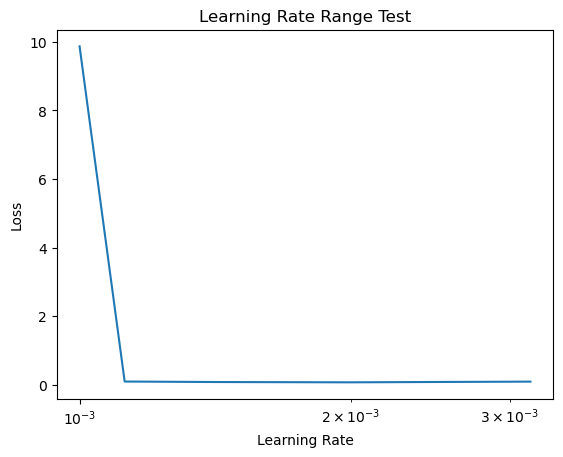

Best Learning Rate: 0.0019952625


In [15]:
# Define a learning rate schedule function for the learning rate range test.
# This function adjusts the learning rate exponentially across epochs.
def lr_schedule(epoch, lr):
    """
    Learning rate schedule for learning rate range test.
    
    Parameters:
    - epoch: Current epoch number
    - lr: Current learning rate
    
    Returns:
    - New learning rate adjusted based on epoch number
    """
    return lr * 10 ** (epoch / 20)  # Exponential increase of learning rate

# Create a LearningRateScheduler callback using the lr_schedule function.
# This callback will adjust the learning rate at the start of every epoch.
lr_range_test = LearningRateScheduler(lr_schedule)

# Perform the learning rate range test to determine the best learning rate.
# The test involves training the model across a range of learning rates and observing the loss.
history_lr_range = model.fit(
    train_data_generator,            # Training data generator
    steps_per_epoch=steps_per_epoch, # Number of steps per epoch
    epochs=5,                        # Number of epochs for the test
    validation_data=(val_images, val_masks),  # Validation data
    callbacks=[lr_range_test]        # Callbacks for the training
)

# Plot the results of the learning rate range test.
# This visual representation helps in identifying the learning rate where the loss decreases the most.
plt.semilogx(history_lr_range.history['lr'], history_lr_range.history['loss'])
plt.xlabel('Learning Rate')
plt.ylabel('Loss')
plt.title('Learning Rate Range Test')
plt.show()

# Determine the learning rate corresponding to the lowest loss from the range test.
# This learning rate is considered optimal as it represents the steepest decrease in loss.
best_lr = history_lr_range.history['lr'][history_lr_range.history['loss'].index(min(history_lr_range.history['loss']))]
print("Best Learning Rate:", best_lr)

In [16]:
# Define a list of potential batch sizes to experiment with during training
batch_sizes = [4, 8, 16]

# Perform a search over the batch sizes to identify which produces the lowest validation loss
batch_size_results = {}  # Dictionary to store validation loss for each batch size

# Iterate over the list of batch sizes
for batch_size in batch_sizes:
    print(f"Trying batch size: {batch_size}")

    # Create an ImageDataGenerator for the training data.
    # This generator will provide batches of augmented images and masks during training.
    augmented_train_data_generator = ImageDataGenerator(
    ).flow(
        train_images,  # Images for training
        train_masks,   # Corresponding masks
        batch_size=batch_size,  # Current batch size under evaluation
        shuffle=True  # Ensure data is shuffled for each epoch to prevent overfitting and model memorization
    )

    # Train the model using the current batch size and collect the training history.
    history = model.fit(
        augmented_train_data_generator,                  # Training data generator
        steps_per_epoch=len(train_images) // batch_size,  # Number of steps in each epoch
        epochs=2,  # Number of epochs for the training run
        validation_data=(val_images, val_masks),  # Validation data for evaluating the model
        verbose=1  # Print training logs for each epoch
    )

    # Store the final validation loss from this training run for the current batch size
    batch_size_results[batch_size] = history.history['val_loss'][-1]
    print(f"Validation loss for batch size {batch_size}: {batch_size_results[batch_size]}")

# Determine which batch size produced the lowest validation loss
best_batch_size = min(batch_size_results, key=batch_size_results.get)
print("Best Batch Size:", best_batch_size)

Trying batch size: 4
Epoch 1/2
47/47 [==============================] - 153s 3s/step - loss: 0.1666 - accuracy: 0.9597 - IoU: 0.4642 - precision: 0.7617 - recall: 0.7515 - f1_score: 0.7280 - val_loss: 0.0946 - val_accuracy: 0.9566 - val_IoU: 0.4650 - val_precision: 0.8062 - val_recall: 0.6140 - val_f1_score: 0.6970
Epoch 2/2
47/47 [==============================] - 163s 3s/step - loss: 0.1242 - accuracy: 0.9647 - IoU: 0.4644 - precision: 0.8058 - recall: 0.7444 - f1_score: 0.7487 - val_loss: 0.1123 - val_accuracy: 0.9560 - val_IoU: 0.4650 - val_precision: 0.9626 - val_recall: 0.4643 - val_f1_score: 0.6234
Validation loss for batch size 4: 0.11226200312376022
Trying batch size: 8
Epoch 1/2
23/23 [==============================] - 177s 8s/step - loss: 0.0690 - accuracy: 0.9686 - IoU: 0.4643 - precision: 0.8165 - recall: 0.7721 - f1_score: 0.7902 - val_loss: 0.1102 - val_accuracy: 0.9622 - val_IoU: 0.4650 - val_precision: 0.9115 - val_recall: 0.5914 - val_f1_score: 0.7163
Epoch 2/2
23/23 

Epoch 1/20
11/11 [==============================] - ETA: 0s - loss: 0.1702 - accuracy: 0.9576 - IoU: 0.4644 - precision: 0.7676 - recall: 0.6429 - f1_score: 0.6768 
Epoch 1: New best model saved with val_loss value: 0.1548

1/1 [==============================] - 1s 591ms/step


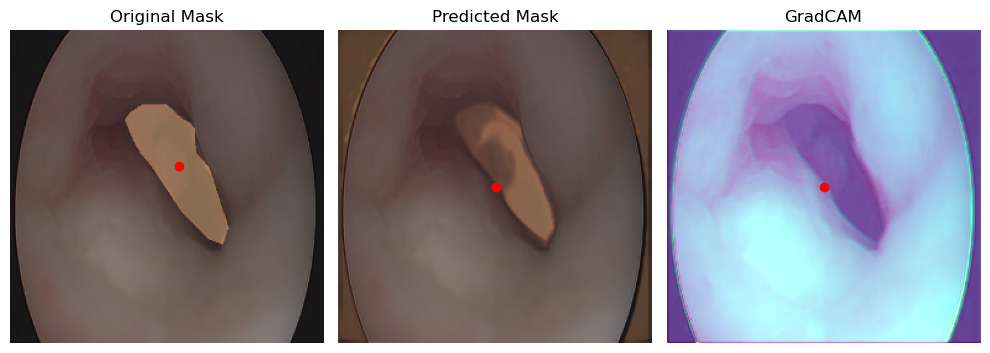

11/11 [==============================] - 156s 14s/step - loss: 0.1702 - accuracy: 0.9576 - IoU: 0.4644 - precision: 0.7676 - recall: 0.6429 - f1_score: 0.6768 - val_loss: 0.1548 - val_accuracy: 0.9309 - val_IoU: 0.4650 - val_precision: 0.6028 - val_recall: 0.4145 - val_f1_score: 0.4908
Epoch 2/20
1/1 [==============================] - 0s 302ms/steposs: 0.0782 - accuracy: 0.9675 - IoU: 0.4644 - precision: 0.8036 - recall: 0.7737 - f1_score: 0.785


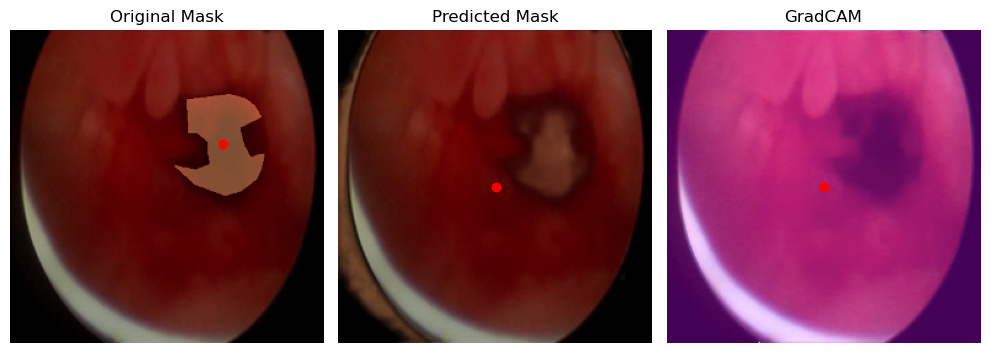

11/11 [==============================] - 192s 18s/step - loss: 0.0782 - accuracy: 0.9675 - IoU: 0.4644 - precision: 0.8036 - recall: 0.7737 - f1_score: 0.7852 - val_loss: 0.1693 - val_accuracy: 0.9133 - val_IoU: 0.4650 - val_precision: 0.4163 - val_recall: 0.1897 - val_f1_score: 0.2555
Epoch 3/20
1/1 [==============================] - 0s 280ms/steposs: 0.0784 - accuracy: 0.9682 - IoU: 0.4648 - precision: 0.8424 - recall: 0.7169 - f1_score: 0.766


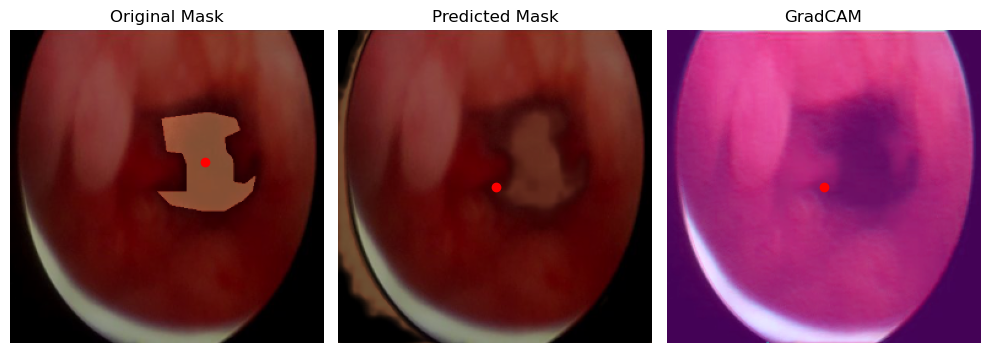

11/11 [==============================] - 182s 17s/step - loss: 0.0784 - accuracy: 0.9682 - IoU: 0.4648 - precision: 0.8424 - recall: 0.7169 - f1_score: 0.7661 - val_loss: 0.1604 - val_accuracy: 0.9219 - val_IoU: 0.4650 - val_precision: 0.5139 - val_recall: 0.2963 - val_f1_score: 0.3758
Epoch 4/20
1/1 [==============================] - 0s 311ms/steposs: 0.0661 - accuracy: 0.9714 - IoU: 0.4643 - precision: 0.8408 - recall: 0.7817 - f1_score: 0.808


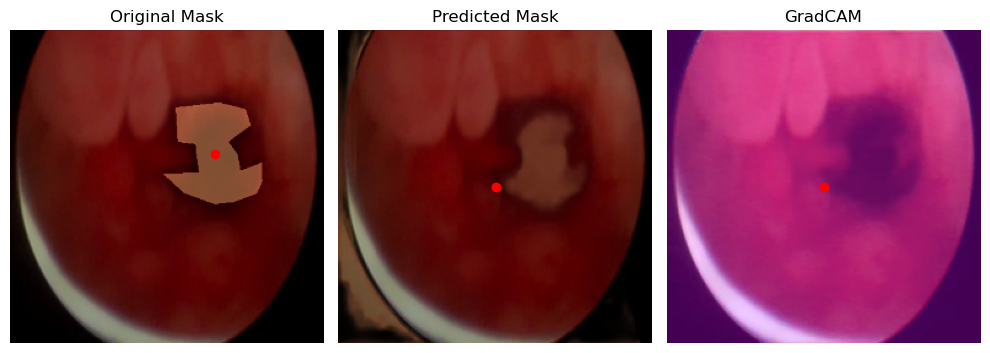

11/11 [==============================] - 187s 17s/step - loss: 0.0661 - accuracy: 0.9714 - IoU: 0.4643 - precision: 0.8408 - recall: 0.7817 - f1_score: 0.8081 - val_loss: 0.1719 - val_accuracy: 0.9332 - val_IoU: 0.4650 - val_precision: 0.6210 - val_recall: 0.4376 - val_f1_score: 0.5134
Epoch 5/20
11/11 [==============================] - ETA: 0s - loss: 0.0654 - accuracy: 0.9707 - IoU: 0.4641 - precision: 0.8530 - recall: 0.7603 - f1_score: 0.8007 
Epoch 5: New best model saved with val_loss value: 0.0818

1/1 [==============================] - 0s 257ms/step


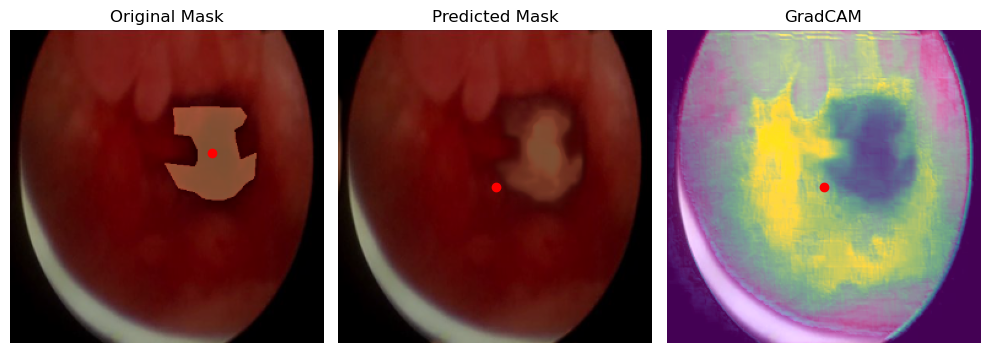

11/11 [==============================] - 179s 16s/step - loss: 0.0654 - accuracy: 0.9707 - IoU: 0.4641 - precision: 0.8530 - recall: 0.7603 - f1_score: 0.8007 - val_loss: 0.0818 - val_accuracy: 0.9616 - val_IoU: 0.4650 - val_precision: 0.8575 - val_recall: 0.6444 - val_f1_score: 0.7357
Epoch 6/20
1/1 [==============================] - 0s 286ms/steposs: 0.0750 - accuracy: 0.9721 - IoU: 0.4641 - precision: 0.8469 - recall: 0.7863 - f1_score: 0.813


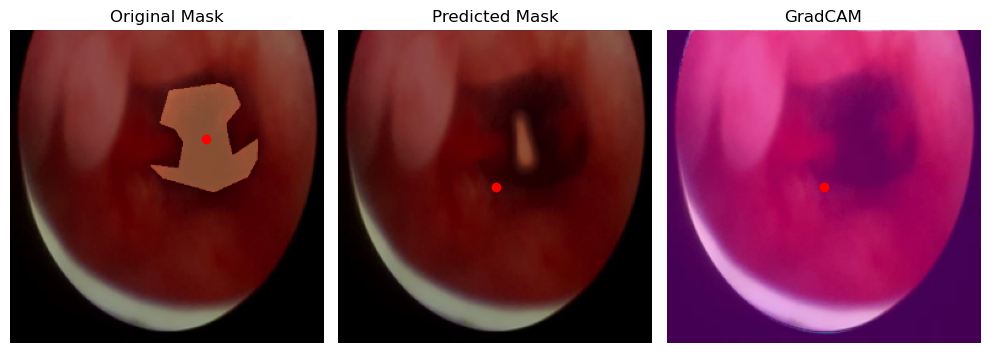

11/11 [==============================] - 181s 17s/step - loss: 0.0750 - accuracy: 0.9721 - IoU: 0.4641 - precision: 0.8469 - recall: 0.7863 - f1_score: 0.8133 - val_loss: 3.2178 - val_accuracy: 0.9388 - val_IoU: 0.4650 - val_precision: 0.9618 - val_recall: 0.2366 - val_f1_score: 0.3667
Epoch 7/20
1/1 [==============================] - 0s 275ms/steposs: 0.0640 - accuracy: 0.9716 - IoU: 0.4641 - precision: 0.8327 - recall: 0.7976 - f1_score: 0.813


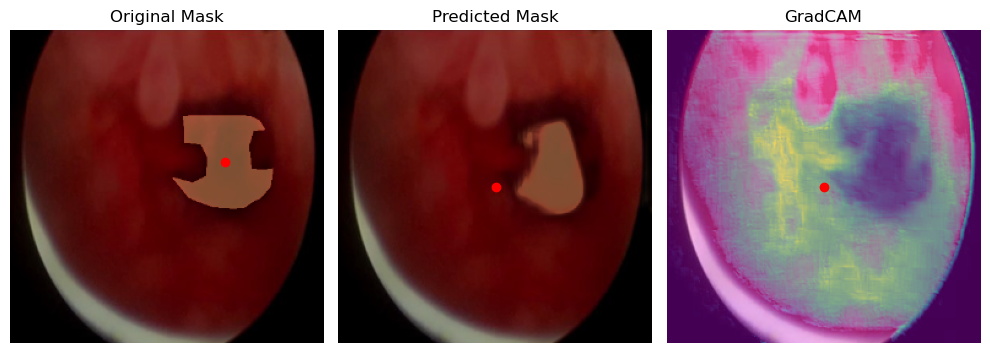

11/11 [==============================] - 185s 17s/step - loss: 0.0640 - accuracy: 0.9716 - IoU: 0.4641 - precision: 0.8327 - recall: 0.7976 - f1_score: 0.8134 - val_loss: 0.3019 - val_accuracy: 0.9620 - val_IoU: 0.4650 - val_precision: 0.8771 - val_recall: 0.6076 - val_f1_score: 0.7129
Epoch 8/20
1/1 [==============================] - 0s 288ms/steposs: 0.0603 - accuracy: 0.9733 - IoU: 0.4642 - precision: 0.8465 - recall: 0.8058 - f1_score: 0.823


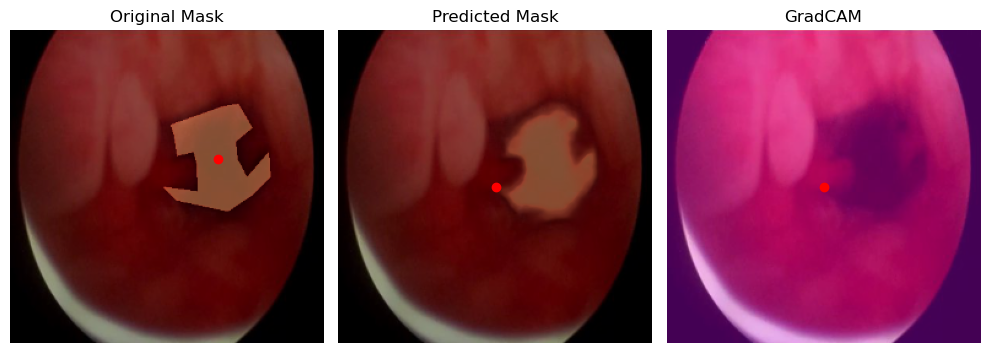

11/11 [==============================] - 182s 17s/step - loss: 0.0603 - accuracy: 0.9733 - IoU: 0.4642 - precision: 0.8465 - recall: 0.8058 - f1_score: 0.8239 - val_loss: 0.1071 - val_accuracy: 0.9708 - val_IoU: 0.4650 - val_precision: 0.8413 - val_recall: 0.7733 - val_f1_score: 0.8039
Epoch 9/20
11/11 [==============================] - ETA: 0s - loss: 0.0650 - accuracy: 0.9728 - IoU: 0.4642 - precision: 0.8384 - recall: 0.8097 - f1_score: 0.8218 
Epoch 9: New best model saved with val_loss value: 0.0751

1/1 [==============================] - 0s 256ms/step


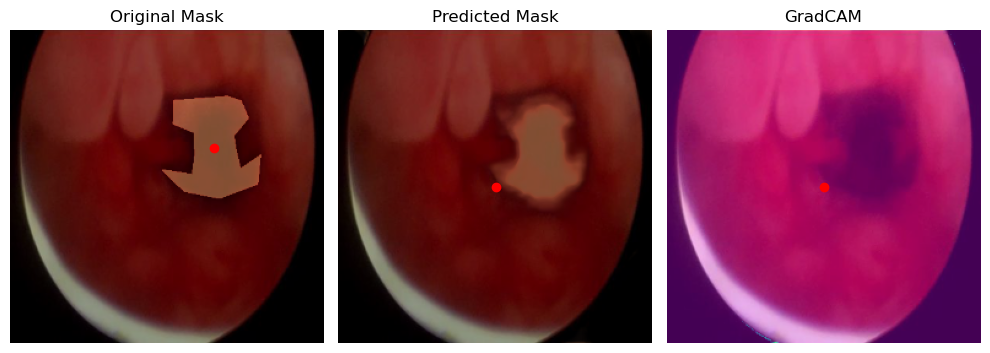

11/11 [==============================] - 183s 17s/step - loss: 0.0650 - accuracy: 0.9728 - IoU: 0.4642 - precision: 0.8384 - recall: 0.8097 - f1_score: 0.8218 - val_loss: 0.0751 - val_accuracy: 0.9703 - val_IoU: 0.4650 - val_precision: 0.8451 - val_recall: 0.7681 - val_f1_score: 0.8020
Epoch 10/20
11/11 [==============================] - ETA: 0s - loss: 0.0589 - accuracy: 0.9736 - IoU: 0.4645 - precision: 0.8387 - recall: 0.8187 - f1_score: 0.8272 
Epoch 10: New best model saved with val_loss value: 0.0740

1/1 [==============================] - 0s 261ms/step


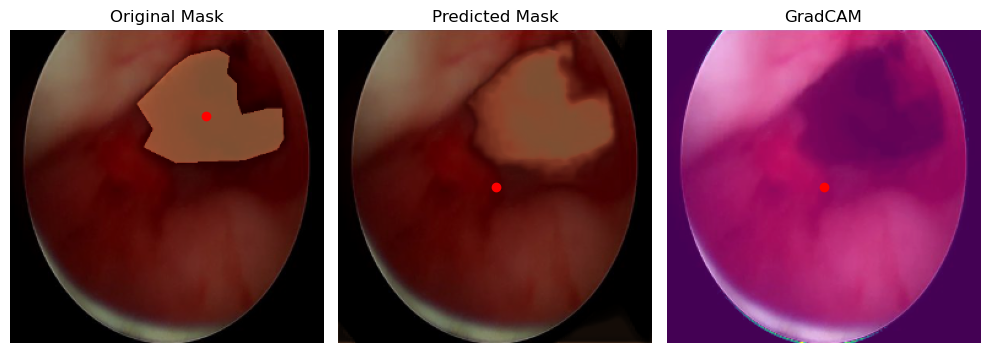

11/11 [==============================] - 181s 17s/step - loss: 0.0589 - accuracy: 0.9736 - IoU: 0.4645 - precision: 0.8387 - recall: 0.8187 - f1_score: 0.8272 - val_loss: 0.0740 - val_accuracy: 0.9715 - val_IoU: 0.4650 - val_precision: 0.8652 - val_recall: 0.7617 - val_f1_score: 0.8073
Epoch 11/20
11/11 [==============================] - ETA: 0s - loss: 0.0568 - accuracy: 0.9740 - IoU: 0.4643 - precision: 0.8421 - recall: 0.8208 - f1_score: 0.8303 
Epoch 11: New best model saved with val_loss value: 0.0690

1/1 [==============================] - 0s 261ms/step


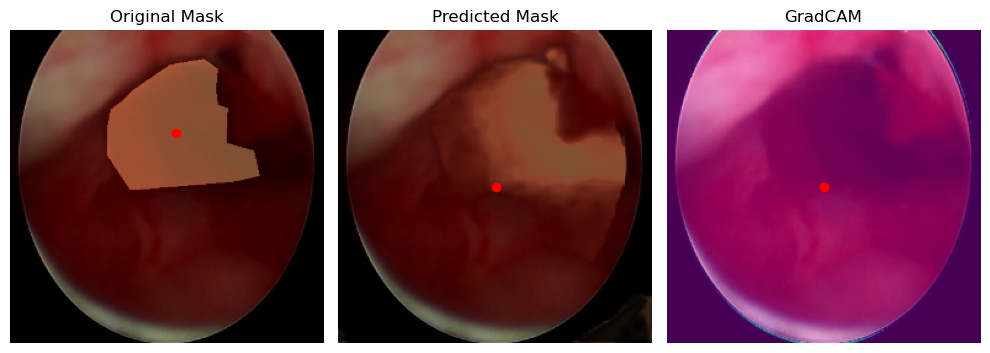

11/11 [==============================] - 186s 17s/step - loss: 0.0568 - accuracy: 0.9740 - IoU: 0.4643 - precision: 0.8421 - recall: 0.8208 - f1_score: 0.8303 - val_loss: 0.0690 - val_accuracy: 0.9719 - val_IoU: 0.4650 - val_precision: 0.8457 - val_recall: 0.7875 - val_f1_score: 0.8136
Epoch 12/20
11/11 [==============================] - ETA: 0s - loss: 0.0572 - accuracy: 0.9742 - IoU: 0.4646 - precision: 0.8478 - recall: 0.8137 - f1_score: 0.8292 
Epoch 12: New best model saved with val_loss value: 0.0603

1/1 [==============================] - 0s 249ms/step


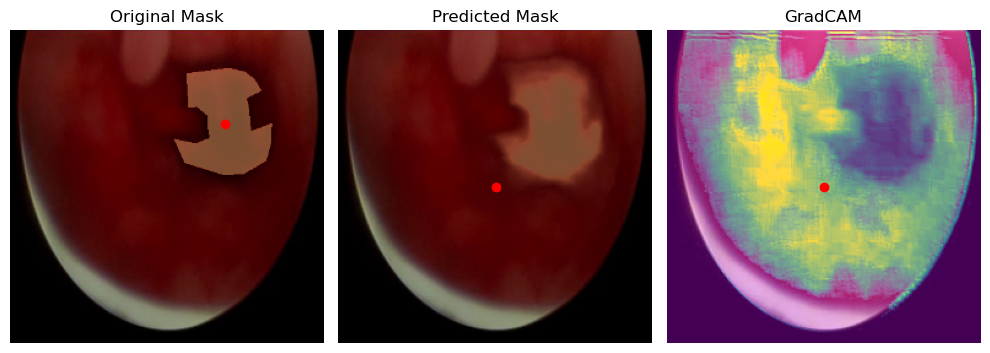

11/11 [==============================] - 193s 18s/step - loss: 0.0572 - accuracy: 0.9742 - IoU: 0.4646 - precision: 0.8478 - recall: 0.8137 - f1_score: 0.8292 - val_loss: 0.0603 - val_accuracy: 0.9731 - val_IoU: 0.4650 - val_precision: 0.8406 - val_recall: 0.8097 - val_f1_score: 0.8229
Epoch 13/20
1/1 [==============================] - 0s 286ms/steposs: 0.0563 - accuracy: 0.9739 - IoU: 0.4644 - precision: 0.8476 - recall: 0.8114 - f1_score: 0.828


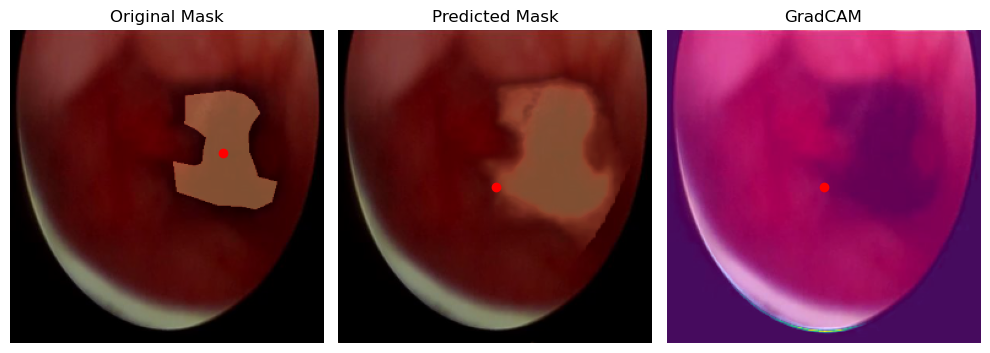

11/11 [==============================] - 181s 17s/step - loss: 0.0563 - accuracy: 0.9739 - IoU: 0.4644 - precision: 0.8476 - recall: 0.8114 - f1_score: 0.8281 - val_loss: 0.0610 - val_accuracy: 0.9725 - val_IoU: 0.4650 - val_precision: 0.8038 - val_recall: 0.8514 - val_f1_score: 0.8253
Epoch 14/20
11/11 [==============================] - ETA: 0s - loss: 0.0550 - accuracy: 0.9746 - IoU: 0.4644 - precision: 0.8532 - recall: 0.8149 - f1_score: 0.8324 
Epoch 14: New best model saved with val_loss value: 0.0600

1/1 [==============================] - 0s 277ms/step


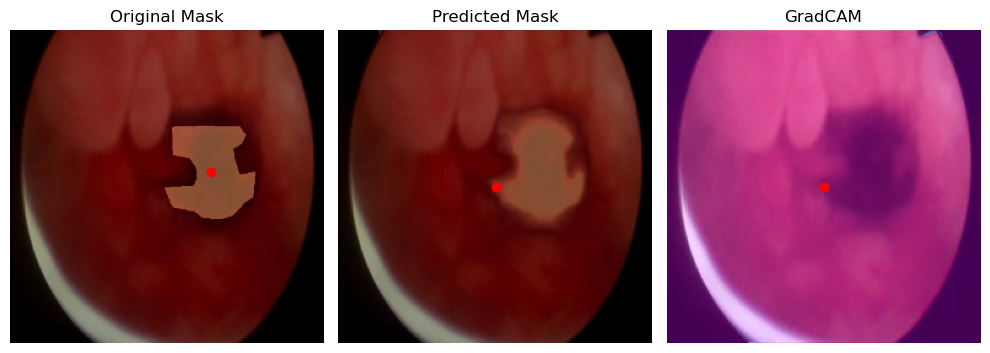

11/11 [==============================] - 196s 18s/step - loss: 0.0550 - accuracy: 0.9746 - IoU: 0.4644 - precision: 0.8532 - recall: 0.8149 - f1_score: 0.8324 - val_loss: 0.0600 - val_accuracy: 0.9730 - val_IoU: 0.4650 - val_precision: 0.8011 - val_recall: 0.8609 - val_f1_score: 0.8284
Epoch 15/20
1/1 [==============================] - 0s 276ms/steposs: 0.0547 - accuracy: 0.9752 - IoU: 0.4648 - precision: 0.8478 - recall: 0.8279 - f1_score: 0.836


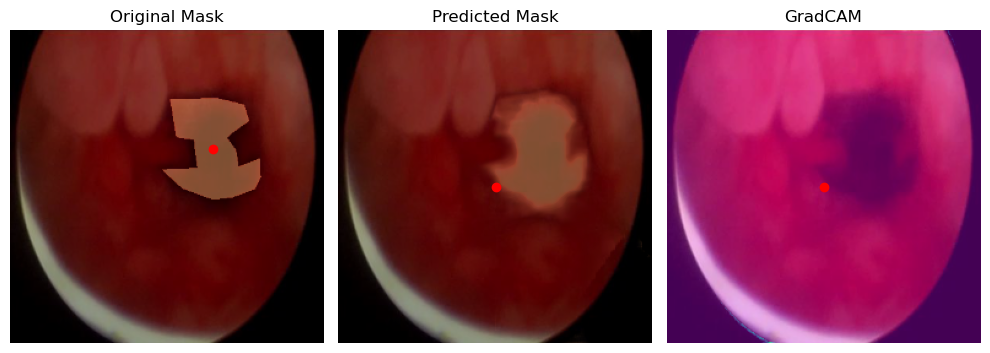

11/11 [==============================] - 190s 17s/step - loss: 0.0547 - accuracy: 0.9752 - IoU: 0.4648 - precision: 0.8478 - recall: 0.8279 - f1_score: 0.8368 - val_loss: 0.0745 - val_accuracy: 0.9677 - val_IoU: 0.4650 - val_precision: 0.7203 - val_recall: 0.9061 - val_f1_score: 0.8013
Epoch 16/20
1/1 [==============================] - 0s 255ms/steposs: 0.0556 - accuracy: 0.9747 - IoU: 0.4643 - precision: 0.8517 - recall: 0.8187 - f1_score: 0.833


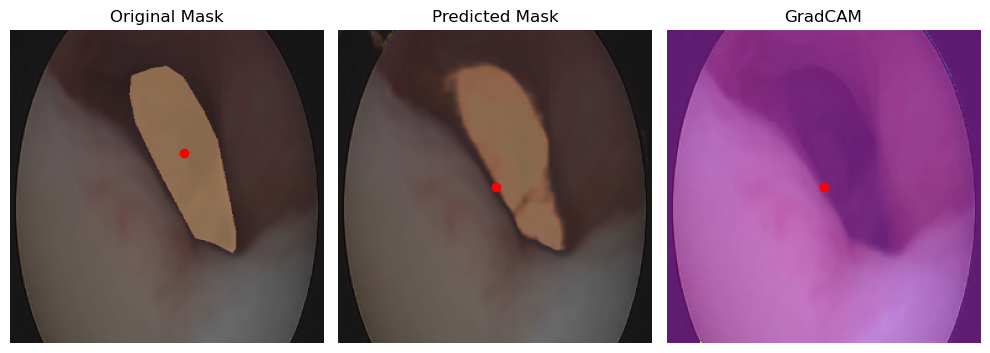

11/11 [==============================] - 165s 15s/step - loss: 0.0556 - accuracy: 0.9747 - IoU: 0.4643 - precision: 0.8517 - recall: 0.8187 - f1_score: 0.8338 - val_loss: 0.0931 - val_accuracy: 0.9657 - val_IoU: 0.4650 - val_precision: 0.7062 - val_recall: 0.9070 - val_f1_score: 0.7937
Epoch 17/20
1/1 [==============================] - 0s 256ms/steposs: 0.0646 - accuracy: 0.9735 - IoU: 0.4641 - precision: 0.8431 - recall: 0.8140 - f1_score: 0.827


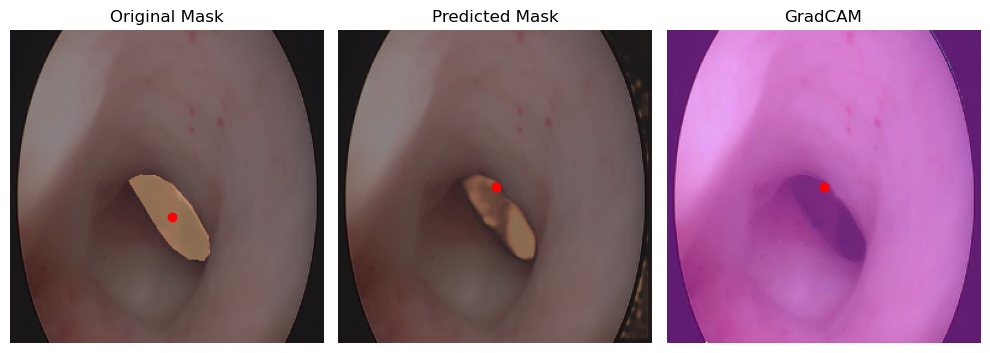

11/11 [==============================] - 154s 14s/step - loss: 0.0646 - accuracy: 0.9735 - IoU: 0.4641 - precision: 0.8431 - recall: 0.8140 - f1_score: 0.8274 - val_loss: 0.0643 - val_accuracy: 0.9737 - val_IoU: 0.4650 - val_precision: 0.8209 - val_recall: 0.8490 - val_f1_score: 0.8326
Epoch 18/20
1/1 [==============================] - 0s 254ms/steposs: 0.1734 - accuracy: 0.9726 - IoU: 0.4641 - precision: 0.8632 - recall: 0.7740 - f1_score: 0.814


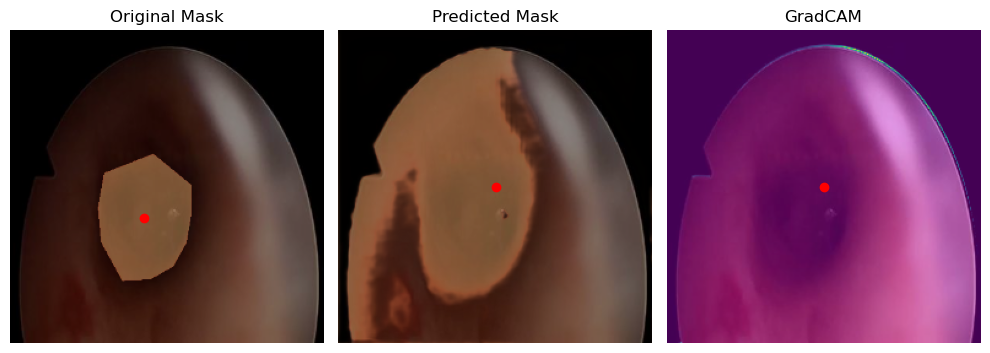

11/11 [==============================] - 155s 14s/step - loss: 0.1734 - accuracy: 0.9726 - IoU: 0.4641 - precision: 0.8632 - recall: 0.7740 - f1_score: 0.8140 - val_loss: 0.1796 - val_accuracy: 0.9392 - val_IoU: 0.4650 - val_precision: 0.5593 - val_recall: 0.9364 - val_f1_score: 0.7003
Epoch 19/20
1/1 [==============================] - 0s 255ms/steposs: 0.1436 - accuracy: 0.9664 - IoU: 0.4640 - precision: 0.7988 - recall: 0.7617 - f1_score: 0.776


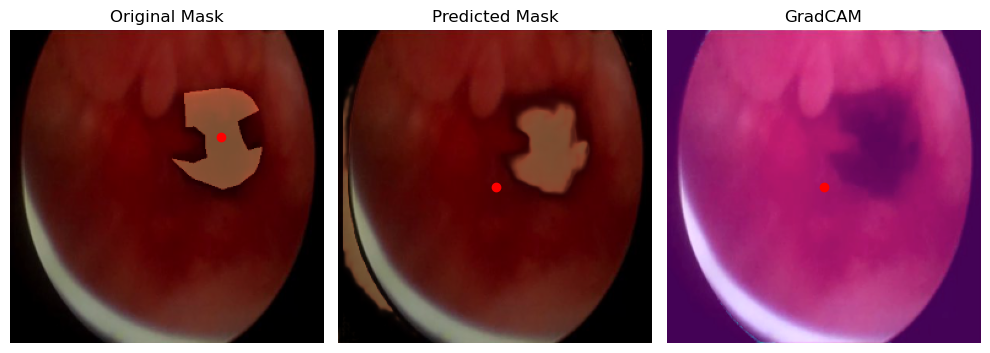

11/11 [==============================] - 154s 14s/step - loss: 0.1436 - accuracy: 0.9664 - IoU: 0.4640 - precision: 0.7988 - recall: 0.7617 - f1_score: 0.7760 - val_loss: 0.1927 - val_accuracy: 0.9564 - val_IoU: 0.4650 - val_precision: 0.7752 - val_recall: 0.6570 - val_f1_score: 0.7105
Epoch 20/20
1/1 [==============================] - 0s 258ms/steposs: 0.0794 - accuracy: 0.9652 - IoU: 0.4642 - precision: 0.8084 - recall: 0.7220 - f1_score: 0.757


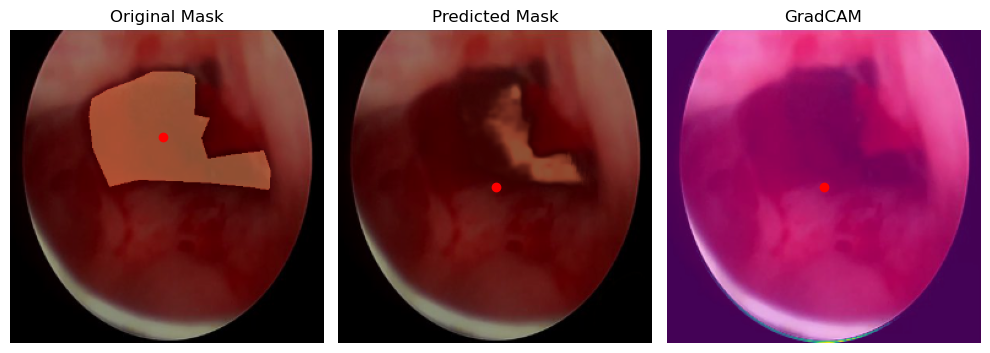

11/11 [==============================] - 156s 14s/step - loss: 0.0794 - accuracy: 0.9652 - IoU: 0.4642 - precision: 0.8084 - recall: 0.7220 - f1_score: 0.7572 - val_loss: 0.1620 - val_accuracy: 0.9676 - val_IoU: 0.4650 - val_precision: 0.8279 - val_recall: 0.7519 - val_f1_score: 0.7858


In [17]:
# Compile the model using the optimized learning rate identified from the learning rate range test.
# The model is set up with a binary cross-entropy loss, the Adam optimizer, and a set of metrics to monitor during training.
model.compile(
    loss='binary_crossentropy',  # Loss function for binary classification tasks
    optimizer=tf.keras.optimizers.Adam(learning_rate=best_lr),  # Adam optimizer with the best learning rate
    metrics=[
        'accuracy',               # Standard accuracy metric
        MeanIoU(num_classes=2, name='IoU'),  # Intersection over Union (IoU) for segmentation tasks
        precision,                # Precision metric
        recall,                   # Recall metric
        f1_score                  # F1 Score, harmonic mean of precision and recall
    ]
)

# Create a new data generator instance using the optimal batch size identified from the batch size search.
# This generator will provide batches of images and masks during training.
best_train_data_generator = custom_data_generator(train_image_paths, train_mask_paths, best_batch_size, SIZE)

# Train the model using the optimized hyperparameters (best learning rate and best batch size).
# The model is trained for a specified number of epochs, and its performance is evaluated on validation data.
best_results = model.fit(
    best_train_data_generator,                               # Training data generator
    steps_per_epoch=len(train_image_paths) // best_batch_size,  # Number of steps in each epoch based on the best batch size
    epochs=20,                                               # Number of epochs for the training run
    validation_data=(val_images, val_masks),                 # Validation data for evaluating the model's performance
    callbacks=cb                                             # List of callbacks to apply during training
)


In [18]:
# Evaluate the model performance on test data
model.evaluate(test_images, test_masks)

2/2 [==============================] - 8s 2s/step - loss: 0.1679 - accuracy: 0.9596 - IoU: 0.4619 - precision: 0.8089 - recall: 0.7266 - f1_score: 0.7652


[0.16787540912628174,
 0.9596489071846008,
 0.4618995785713196,
 0.8088532090187073,
 0.7266439199447632,
 0.7652032375335693]

1/1 [==============================] - 0s 221ms/step


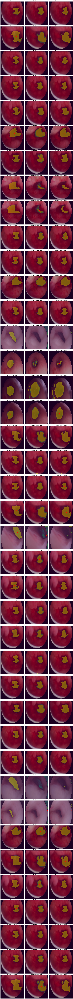

In [19]:
def post_process_mask(pred_mask):
    """Post-process predicted mask to create a binary mask."""
    threshold = 0.5  
    binary_mask = (pred_mask > threshold).astype(np.uint8)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    morphed_mask = cv2.morphologyEx(binary_mask, cv2.MORPH_CLOSE, kernel)
    return morphed_mask

plt.figure(figsize=(15, 5 * len(test_images)))  # Adjust the figure size
n = 0  
for i in range(1, (len(test_images) * 3) + 1):
    plt.subplot(len(test_images), 3, i)
    if n == 0:
        image = test_images[(i - 1) // 3]
        mask = test_masks[(i - 1) // 3]
        pred_mask = model.predict(image[np.newaxis, ...])[0]  # Predict mask and remove unnecessary axis
        original_centroid = calculate_centroid(mask)
        
        plt.title("Original Mask over Image")
        show_mask(image, mask, original_centroid)  # Display the original image with its mask and its centroid
        plt.axis('off')  # Turn off axis labels and ticks
        n += 1
    elif n == 1:
        plt.title("Predicted Mask over Image")
        processed_mask = post_process_mask(pred_mask)
        processed_centroid = calculate_centroid(processed_mask.squeeze()) # Calculate centroid for processed mask
        
        # Visualize the raw predicted mask values
        # Use the processed centroid for predicted mask
        show_mask(image, pred_mask, processed_centroid) # Display the predicted mask and its centroid
        n += 1
    elif n == 2:
        plt.title("Processed Mask over Image")
        show_mask(image, processed_mask, processed_centroid) # Display the processed mask and its centroid
        n = 0 

plt.tight_layout()
plt.show()

In [20]:
# Extract performance metrics from the 'best_results' history object.
# These metrics are assumed to be calculated during model training on both training and validation datasets.
loss, accuracy, IoU, val_loss, val_accuracy, val_IoU, precision, recall, f1_score, val_precision, val_recall, val_f1_score = best_results.history.values()


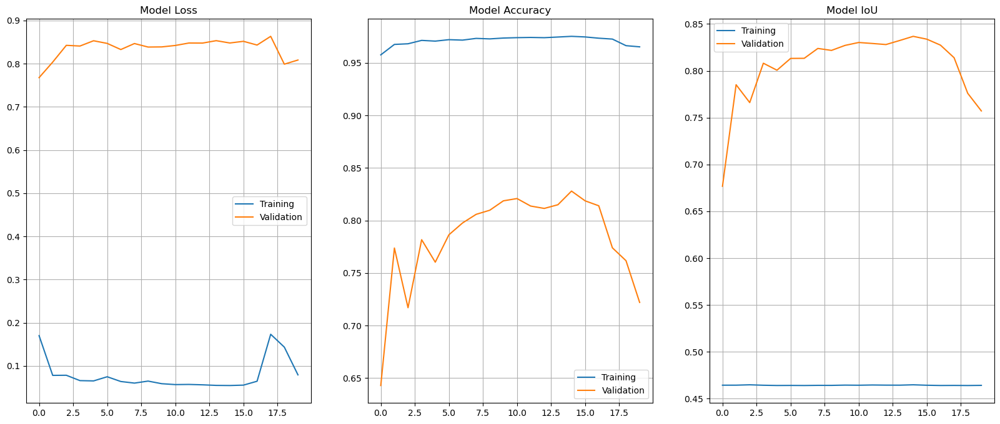

In [21]:

# Set up a figure with an adjusted size to visualize the model's performance metrics
plt.figure(figsize=(20,8))

# Plot the model's loss over epochs for training and validation datasets
plt.subplot(1,3,1)  # This will be the first plot in a 1x3 grid
plt.title("Model Loss")  # Set title for the subplot
plt.plot(loss, label="Training")  # Plot training loss
plt.plot(val_loss, label="Validation")  # Plot validation loss
plt.legend()  # Display legend to differentiate between training and validation lines
plt.grid()  # Add a grid for better readability

# Plot the model's accuracy over epochs for training and validation datasets
plt.subplot(1,3,2)  # This will be the second plot in a 1x3 grid
plt.title("Model Accuracy")  # Set title for the subplot
plt.plot(accuracy, label="Training")  # Plot training accuracy
plt.plot(val_accuracy, label="Validation")  # Plot validation accuracy
plt.legend()  # Display legend to differentiate between training and validation lines
plt.grid()  # Add a grid for better readability

# Plot the model's Intersection over Union (IoU) over epochs for training and validation datasets
plt.subplot(1,3,3)  # This will be the third plot in a 1x3 grid
plt.title("Model IoU")  # Set title for the subplot
plt.plot(IoU, label="Training")  # Plot training IoU
plt.plot(val_IoU, label="Validation")  # Plot validation IoU
plt.legend()  # Display legend to differentiate between training and validation lines
plt.grid()  # Add a grid for better readability

# Display the entire figure containing all subplots
plt.show()
